<img align="top"  width="1100" height="400" src="https://dataanalyticsedge.com/wp-content/uploads/2019/11/feature_en_diamond_certification-777x383.jpg">

## DIAMOND_PRICE_PREDICTION_USING_KNN_REGRESSOR

### About this file
    A data frame with 53940 rows and 10 variables:
    price
    price in US dollars (\$326--\$18,823)
    carat
    weight of the diamond (0.2--5.01)
    cut
    quality of the cut (Fair, Good, Very Good, Premium, Ideal)
    color
    diamond colour, from J (worst) to D (best)
    clarity
    a measurement of how clear the diamond is (I1 (worst), SI2, SI1, VS2, VS1, VVS2, VVS1, IF (best))
    x
    length in mm (0--10.74)
    y
    width in mm (0--58.9)
    z
    depth in mm (0--31.8)
    depth
    total depth percentage = z / mean(x, y) = 2 * z / (x + y) (43--79)
    table
    width of top of diamond relative to widest point (43--95)

## INSTALLING  PYHON LIBRARIES 

In [1]:
pip install cufflinks

## IMPORTING LIBRARIES

In [3]:
import pandas as pd
import numpy as np 
import matplotlib.pyplot as plt
%matplotlib inline 
import seaborn as sns 
import plotly.graph_objs as go
#import plotly.plotly as py
from plotly.offline import download_plotlyjs, init_notebook_mode, plot, iplot
init_notebook_mode(connected=True)
import cufflinks as cf

## LOADING DATASET

In [4]:
data = pd.read_csv('diamonds.csv')
data.head()

,Unnamed: 0,carat,cut,color,clarity,depth,table,price,x,y,z
0,1,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,2,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,3,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,4,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,5,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


## DATA INSIGHTS

In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53940 entries, 0 to 53939
Data columns (total 11 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Unnamed: 0  53940 non-null  int64  
 1   carat       53940 non-null  float64
 2   cut         53940 non-null  object 
 3   color       53940 non-null  object 
 4   clarity     53940 non-null  object 
 5   depth       53940 non-null  float64
 6   table       53940 non-null  float64
 7   price       53940 non-null  int64  
 8   x           53940 non-null  float64
 9   y           53940 non-null  float64
 10  z           53940 non-null  float64
dtypes: float64(6), int64(2), object(3)
memory usage: 4.5+ MB


In [6]:
data.describe()

,Unnamed: 0,carat,depth,table,price,x,y,z
count,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000,53940.000000
mean,26970.500000,0.797940,61.749405,57.457184,3932.799722,5.731157,5.734526,3.538734
std,15571.281097,0.474011,1.432621,2.234491,3989.439738,1.121761,1.142135,0.705699
min,1.000000,0.200000,43.000000,43.000000,326.000000,0.000000,0.000000,0.000000
25%,13485.750000,0.400000,61.000000,56.000000,950.000000,4.710000,4.720000,2.910000
50%,26970.500000,0.700000,61.800000,57.000000,2401.000000,5.700000,5.710000,3.530000
75%,40455.250000,1.040000,62.500000,59.000000,5324.250000,6.540000,6.540000,4.040000
max,53940.000000,5.010000,79.000000,95.000000,18823.000000,10.740000,58.900000,31.800000


## CHECKING NULL_DATA

In [7]:
data.isnull().sum()

Unnamed: 0    0
carat         0
cut           0
color         0
clarity       0
depth         0
table         0
price         0
x             0
y             0
z             0
dtype: int64

In [8]:
data.dtypes

Unnamed: 0      int64
carat         float64
cut            object
color          object
clarity        object
depth         float64
table         float64
price           int64
x             float64
y             float64
z             float64
dtype: object

## DROPING UNNECESSARY & DROPING THE COLUMN

In [9]:
data.drop('Unnamed: 0',axis=1,inplace=True)

In [12]:
data.drop_duplicates(keep=False,inplace=True)

In [13]:
data.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


## CHECKING THE VALUE_COUNTS

In [14]:
data.cut.value_counts()

Ideal        21428
Premium      13705
Very Good    12056
Good          4876
Fair          1586
Name: cut, dtype: int64

In [15]:
data['color'].value_counts()

G    11235
E     9755
F     9498
H     8240
D     6735
I     5392
J     2796
Name: color, dtype: int64

In [16]:
data.clarity.value_counts()

SI1     13002
VS2     12200
SI2      9106
VS1      8141
VVS2     5046
VVS1     3639
IF       1778
I1        739
Name: clarity, dtype: int64

In [17]:
data.depth.value_counts()

62.0    2227
61.9    2157
61.8    2061
62.2    2027
62.1    2002
        ... 
54.0       1
44.0       1
52.2       1
52.7       1
53.0       1
Name: depth, Length: 183, dtype: int64

In [18]:
data.table.value_counts()

56.0    9821
57.0    9669
58.0    8335
59.0    6552
55.0    6216
        ... 
64.2       1
79.0       1
64.3       1
63.3       1
65.4       1
Name: table, Length: 127, dtype: int64

In [19]:
data.carat.value_counts()

0.30    2588
1.01    2238
0.31    2227
0.70    1981
0.32    1814
        ... 
2.77       1
3.11       1
5.01       1
3.67       1
3.65       1
Name: carat, Length: 273, dtype: int64

In [20]:
data.groupby('price')['cut'].agg(sum)

price
326            IdealPremium
327                    Good
334                 Premium
335                    Good
336      Very GoodVery Good
                ...        
18803             Very Good
18804                 Ideal
18806                 Ideal
18818             Very Good
18823               Premium
Name: cut, Length: 11595, dtype: object

# DATA VISUALIZATION

<img align="top"  width="800" height="300" src="https://d87r087mitamg.cloudfront.net/media/20180307145734/Harry-Winston-Holds-Famous-Stones-in-Palm-08.16.13-1024x789.jpg">

## CHECKING OUTLIEARS

In [21]:
import plotly.express as px
 
fig = px.box(data, x = "cut", y="price", points="outliers")
fig.show()

In [22]:
fig = px.box(data, x = "cut", y="price", points="all", notched=True)
fig.update_traces(quartilemethod="exclusive")
 
fig.show()

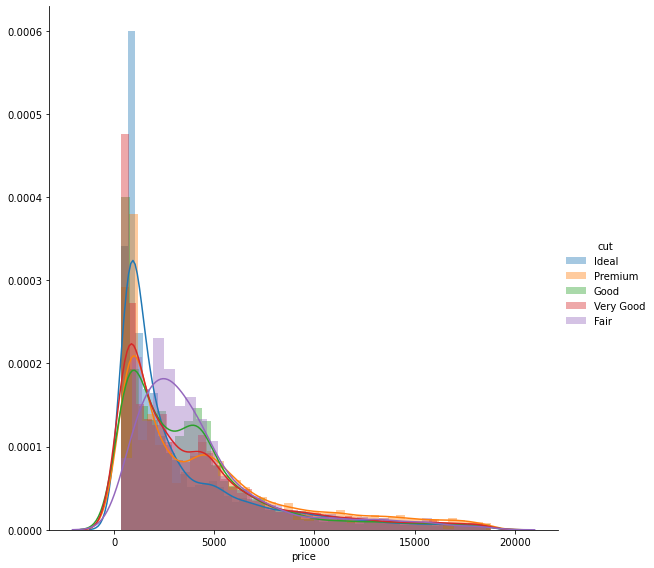

In [23]:
import warnings
warnings.filterwarnings('ignore')

sns.FacetGrid(data, hue = 'cut',height=8).map(sns.distplot, 'price').add_legend()
plt.show()

In [24]:
import plotly.express as px
 
fig = px.box(data, x = "clarity", y="price", points="outliers")
fig.show()

In [25]:
fig = px.scatter(data, x="cut", y="carat",size='price')
fig.show()

In [26]:
data.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,Ideal,E,SI2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,Premium,E,SI1,59.8,61.0,326,3.89,3.84,2.31
2,0.23,Good,E,VS1,56.9,65.0,327,4.05,4.07,2.31
3,0.29,Premium,I,VS2,62.4,58.0,334,4.20,4.23,2.63
4,0.31,Good,J,SI2,63.3,58.0,335,4.34,4.35,2.75


## FEATURE ENGINEERING

In [27]:
cut_dim = {'Ideal':1, 'Premium':2, 'Very Good':3, "Good":4, "Fair":5}
clarity_dict ={ 'I1' : 1, 'SI2' : 2, 'SI1' : 3, 'VS2' : 4, 'VS1' : 5, 'VVS2' : 6, 'VVS1' : 7 , 'IF' : 8}
color_dict = {'D':7, 'E':6, 'F':5, 'G':4, 'H':3, 'I':2, 'J':1}

In [28]:
data["cut"] = data["cut"].map(cut_dim)
data["clarity"] = data["clarity"].map(clarity_dict)
data["color"] = data["color"].map(color_dict)

In [29]:
data.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,0.23,1,6,2,61.5,55.0,326,3.95,3.98,2.43
1,0.21,2,6,3,59.8,61.0,326,3.89,3.84,2.31
2,0.23,4,6,5,56.9,65.0,327,4.05,4.07,2.31
3,0.29,2,2,4,62.4,58.0,334,4.20,4.23,2.63
4,0.31,4,1,2,63.3,58.0,335,4.34,4.35,2.75


## FAETURE SCALLING

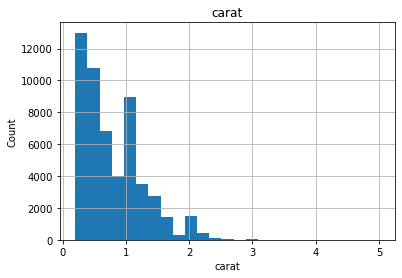

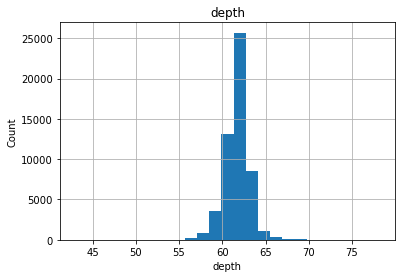

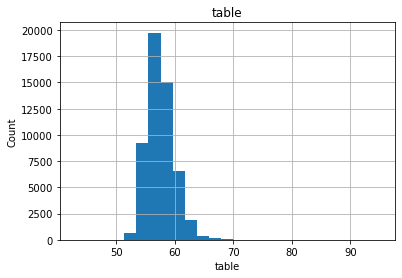

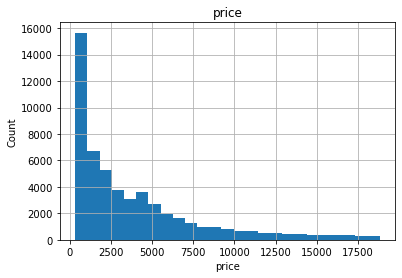

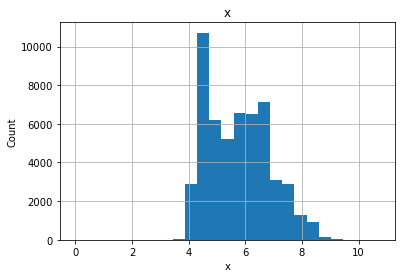

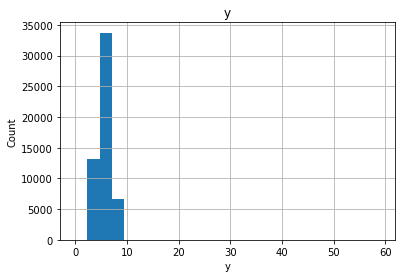

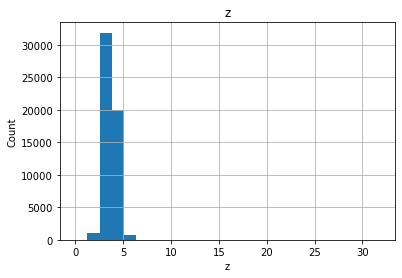

In [30]:
faeture_col=['carat','depth','table','price','x','y','z']

for feature in faeture_col:
    data[feature].hist(bins=25)
    plt.xlabel(feature)
    plt.ylabel("Count")
    plt.title(feature)
    plt.show()

In [31]:
column = ['carat','cut','color','clarity','depth','table','price','x','y','z']

In [32]:
from sklearn.preprocessing import StandardScaler
scaler=StandardScaler()
scaler.fit(data[column])

StandardScaler()

In [33]:
scaler.transform(data[column])

array([[-1.2006816 , -0.98223779,  0.93685375, ..., -1.59102523,
        -1.53896933, -1.574084  ],
       [-1.2429875 , -0.08584493,  0.93685375, ..., -1.64461671,
        -1.66175096, -1.74445476],
       [-1.2006816 ,  1.70694079,  0.93685375, ..., -1.50170609,
        -1.46003828, -1.74445476],
       ...,
       [-0.20649308,  0.81054793,  1.52471986, ..., -0.06366796,
        -0.04804953,  0.03024064],
       [ 0.13195408, -0.08584493, -0.82674459, ...,  0.37399582,
         0.33783559,  0.28579678],
       [-0.10072834, -0.98223779,  1.52471986, ...,  0.08817458,
         0.11858268,  0.14382115]])

In [34]:
pd.DataFrame(scaler.transform(data[column]), columns=column)

,carat,cut,color,clarity,depth,table,price,x,y,z
0,-1.200682,-0.982238,0.936854,-1.246721,-0.172919,-1.101322,-0.904841,-1.591025,-1.538969,-1.574084
1,-1.242987,-0.085845,0.936854,-0.639384,-1.364123,1.585908,-0.904841,-1.644617,-1.661751,-1.744455
2,-1.200682,1.706941,0.936854,0.575290,-3.396175,3.377395,-0.904590,-1.501706,-1.460038,-1.744455
3,-1.073764,-0.085845,-1.414611,-0.032047,0.457718,0.242293,-0.902834,-1.367727,-1.319716,-1.290133
4,-1.031458,1.706941,-2.002477,-1.246721,1.088354,0.242293,-0.902583,-1.242681,-1.214475,-1.119762
...,...,...,...,...,...,...,...,...,...,...
53646,-0.164187,-0.982238,1.524720,-0.639384,-0.663415,-0.205579,-0.295054,0.016719,0.022111,-0.054945
53647,-0.164187,1.706941,1.524720,-0.639384,0.948213,-1.101322,-0.295054,-0.036872,0.013341,0.101228
53648,-0.206493,0.810548,1.524720,-0.639384,0.738001,1.138036,-0.295054,-0.063668,-0.048050,0.030241
53649,0.131954,-0.085845,-0.826745,-1.246721,-0.523273,0.242293,-0.295054,0.373996,0.337836,0.285797


In [35]:
data = pd.concat([pd.DataFrame(scaler.transform(data[column]), columns=column)])

## SCALLED DATA

In [36]:
data.head()

,carat,cut,color,clarity,depth,table,price,x,y,z
0,-1.200682,-0.982238,0.936854,-1.246721,-0.172919,-1.101322,-0.904841,-1.591025,-1.538969,-1.574084
1,-1.242987,-0.085845,0.936854,-0.639384,-1.364123,1.585908,-0.904841,-1.644617,-1.661751,-1.744455
2,-1.200682,1.706941,0.936854,0.575290,-3.396175,3.377395,-0.904590,-1.501706,-1.460038,-1.744455
3,-1.073764,-0.085845,-1.414611,-0.032047,0.457718,0.242293,-0.902834,-1.367727,-1.319716,-1.290133
4,-1.031458,1.706941,-2.002477,-1.246721,1.088354,0.242293,-0.902583,-1.242681,-1.214475,-1.119762


## SPLITING OF DATA

In [37]:
X = data.drop(['price'], axis = 1)
Y = data['price']

In [38]:
from sklearn.model_selection import train_test_split
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=12345)

## MODEL BUILDING

In [39]:
from sklearn.neighbors import KNeighborsRegressor

In [40]:
KNN_model = KNeighborsRegressor(n_neighbors=3)

In [43]:
KNN_model.fit(X_train,Y_train)

KNeighborsRegressor(n_neighbors=3)

In [44]:
from sklearn.metrics import mean_squared_error
from math import sqrt

In [46]:
train_preds = KNN_model.predict(X_train)
mse = mean_squared_error(Y_train, train_preds)
rmse = sqrt(mse)
rmse

0.12760603538919094

In [48]:
test_preds = KNN_model.predict(X_test)
mse = mean_squared_error(Y_test, test_preds)
rmse = sqrt(mse)
rmse

0.19066497863282966

## ACCUARCY

In [54]:
KNN_model.score(X_test,Y_test)

0.96369492540858

## APPILED HYPER TUNNING

In [55]:
from sklearn.model_selection import GridSearchCV

In [56]:
parameters = {'n_neighbors' : range(1,50)}
gridsearch = GridSearchCV(KNeighborsRegressor(), parameters)
gridsearch.fit(X_train, Y_train)

GridSearchCV(estimator=KNeighborsRegressor(),
             param_grid={'n_neighbors': range(1, 50)})

In [57]:
gridsearch.best_params_

{'n_neighbors': 6}

In [58]:
knn_model = KNeighborsRegressor(n_neighbors=3)

In [60]:
knn_model.fit(X_train,Y_train)

KNeighborsRegressor(n_neighbors=3)

In [61]:
train_preds = knn_model.predict(X_train)
mse = mean_squared_error(Y_train, train_preds)
rmse = sqrt(mse)
rmse

0.12760603538919094

In [62]:
test_preds = knn_model.predict(X_test)
mse = mean_squared_error(Y_test, test_preds)
rmse = sqrt(mse)
rmse

0.19066497863282966

## VISUALIZATION OF ACTUAL DATA AND PREDICTED DATA

In [64]:

trace0 = go.Scatter(
    y = Y_test,
    x = np.arange(200), 
    mode = 'lines', 
    name = 'Actual Price',
    marker = dict(
    color = 'rgb(10, 150, 50)')
)

trace1 = go.Scatter(
    y = test_preds,
    x = np.arange(200), 
    mode = 'lines', 
    name = 'Predicted Price',
    line = dict(
        color = 'rgb(110, 50, 140)',
        dash = 'dot'
    )
)


layout = go.Layout(
    xaxis = dict(title = 'Index'), 
    yaxis = dict(title = 'Normalized Price')
)

figure = go.Figure(data = [trace0, trace1], layout = layout)
iplot(figure)

# THE END !